In [ ]:
!pip install twitter &> /dev/null

In [ ]:
!pip install python-dotenv &> /dev/null

In [ ]:
!pip install graphviz &> /dev/null

In [ ]:
!apt install libgraphviz-dev > &> /dev/null

/bin/bash: -c: line 0: syntax error near unexpected token `&>'
/bin/bash: -c: line 0: `apt install libgraphviz-dev > &> /dev/null'


In [ ]:
!pip install pygraphviz &> /dev/null

In [ ]:
import tweepy
import csv
import pandas as pd
consumer_key = '5bk4xeCa5n45zSMKcVKee6dRz'
consumer_secret = 'zNpZnzPn7bvNBXJmLQw3UKnmqymTtVs3pcQ4zEvlHHUO1LSKOm'
access_token = '1340235807790149632-odVF5edmxy3GtoI9t7Cqy3lnHQACZT'
access_token_secret = 'oEUH8FbaznPM7ffUXlZ2fKx4bs36YhHtNLMaOdVqwK211'

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth,wait_on_rate_limit=True)

user_ids = []

csvFile = open('ua.csv', 'w+')
csvWriter = csv.writer(csvFile)

Pobieranie twittów pod zadanym hashtagiem - DontRentDC

In [ ]:
for tweet in tweepy.Cursor(api.search,q="#DontRentDC",count=100,
                           lang="en",
                           since="2021-01-14").items():
    # sprawdzaj czy pobieramy post dla uzytkownika dla ktorego zostało już pobrane                    
    if tweet.author.id not in user_ids:
      user_ids.append(tweet.author.id)
    print(tweet)
    csvWriter.writerow([tweet.created_at, tweet.author.id, tweet.text.encode('utf-8')])

Status(contributors=None, truncated=False, text=u'RT @jimothybringus: Sound the horn folx:\n\n#DontRentDC #BoycottVRBO #BoycottExpedia @ProjectLincoln @melanieho13 @EmBrownDC @EristeoP @nbcwa\u2026', is_quote_status=False, in_reply_to_status_id=None, id=1351733381705441281, favorite_count=0, _api=<tweepy.api.API object at 0x7f64dc2c6850>, author=User(follow_request_sent=False, has_extended_profile=True, profile_use_background_image=True, _json={u'follow_request_sent': False, u'has_extended_profile': True, u'profile_use_background_image': True, u'default_profile_image': True, u'id': 1294400399827509267, u'profile_background_image_url_https': None, u'verified': False, u'translator_type': u'none', u'profile_text_color': u'333333', u'profile_image_url_https': u'https://abs.twimg.com/sticky/default_profile_images/default_profile_normal.png', u'profile_sidebar_fill_color': u'DDEEF6', u'entities': {u'description': {u'urls': []}}, u'followers_count': 12, u'profile_sidebar_border_color': u'C0DE

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
csv_pandas_frame = pd.read_csv('./ua.csv')
csv_pandas_frame.size
len(user_ids)

203

Pobranie dla autorow tweetow osob ktore one followuja limitujemy do 1000 uzytkownikow

<strong>Próba z pierwszym zbiorem danych</strong> - folder <strong><i>stare</i></strong>

In [ ]:
import pandas as pd 
import numpy as np


all_files = ['./following_pairs_0.csv', './following_pairs_200_0.csv', './following_pairs_20_middle.csv']
li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=None)
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True).to_numpy()


In [ ]:
import networkx as nx
from matplotlib import pyplot as plt

MIN_EDGES_FOR_LABEL = 10
CONNECTOR_LABELS = 2

graph = nx.Graph()

for i in frame:
  graph.add_edge(*i)


labels = {}
connector_labels = {}
connector_counts = {}
for node in graph.nodes():
  labels[node] = ""
  connector_labels[node] = ""
  connector_counts[node] = None
  graph_edgex_len = len(graph.edges(node))
  if graph_edgex_len > MIN_EDGES_FOR_LABEL:
    labels[node] = node
  if graph_edgex_len >= CONNECTOR_LABELS and graph_edgex_len <= 20:
    connector_labels[node] = node
    connector_counts[node] = graph_edgex_len


pos = nx.spring_layout(graph)



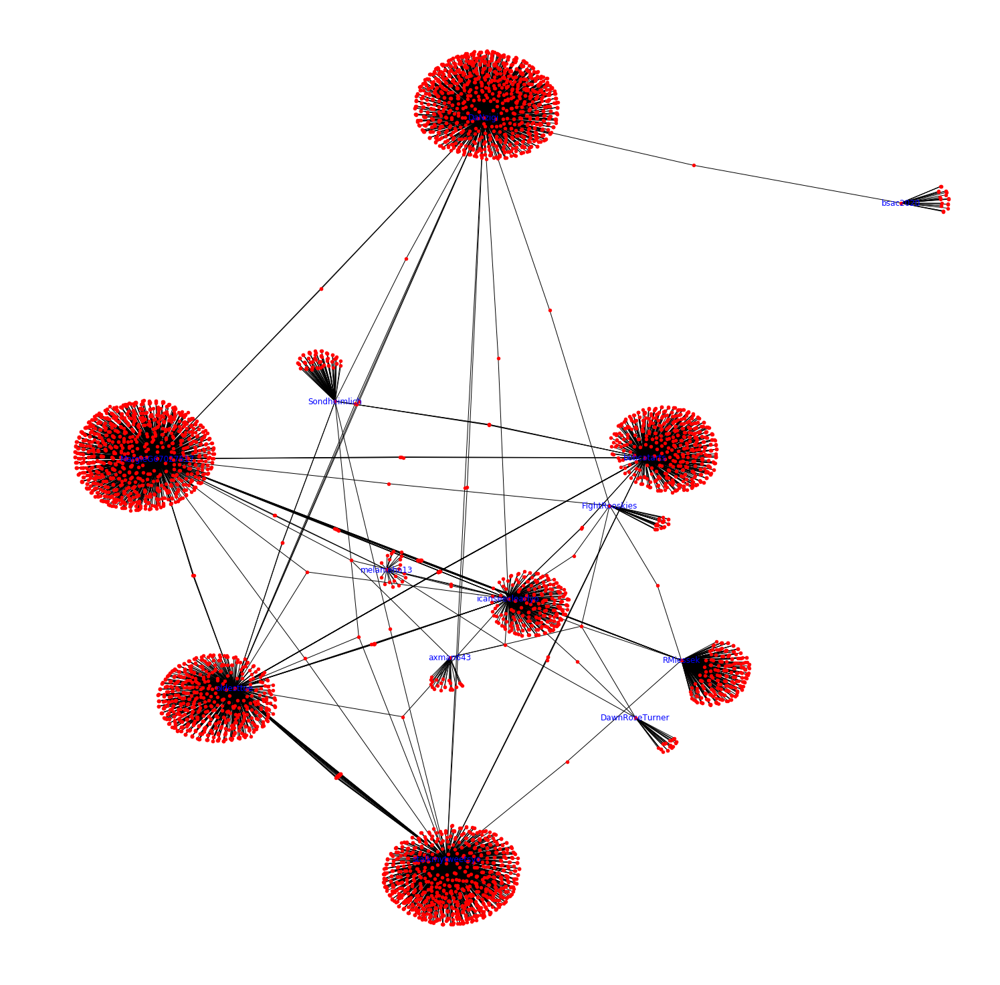

In [ ]:
plt.figure(1, figsize=(20, 20))
nx.draw(graph, with_labels=True, node_size=20, labels=labels, font_color='b', font_size=12)
plt.show()

# plt.figure(2, figsize=(12, 12))
# nx.draw(graph, with_labels=True, node_size=20, labels=connector_labels, font_color='b', font_size=12)
# plt.show()

In [ ]:


for (key, value) in connector_labels.items():
   # Check if key is even then add pair to new dictionary
   if value != '': 
     print("{} {}".format(key, connector_counts[key]))

PramilaJayapal 2
Rogers4Texas 2
JohnKerry 2
AllenLEllison 3
JimGaffigan 2
dionnewarwick 2
WhiteHouse 2
Delavegalaw 2
JoeBiden 2
chipfranklin 2
ladygaga 2
Umberto_Ecco 2
CoriBush 3
moneyymaya 2
iww 2
LittleMissFlint 2
chrisalecanada 2
JoyceWhiteVance 2
katieporteroc 2
rebeccanagle 2
POTUS 3
queersocialism 3
AOC 2
realcaunsia 2
nhannahjones 2
quintabrunson 2
BlackSocialists 2
BrennanCenter 2
BrieforNevada 2
iHartEricka 2
ziwe 2
MeidasTouch 2
sarahcpr 2
RepMaxineWaters 2
noname 2
RonaldKlain 2
fairfightaction 2
BerniceKing 2
Zendaya 2


<strong>Próba z drugim zbiorem danych</strong> - folder <strong><i>dane_zestaw_dwa</i></strong>

In [ ]:
import pandas as pd 
import numpy as np


all_files = ['./following_pairs_0.csv', './following_pairs_200_0.csv', './following_pairs_199_1.csv', './following_pairs_20_middle.csv']
li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=None)
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True).to_numpy()
print(np.shape(frame))

(7721, 2)


In [ ]:
import networkx as nx
from matplotlib import pyplot as plt

MIN_EDGES_FOR_LABEL = 10
CONNECTOR_LABELS = 2

graph = nx.Graph()

for i in frame:
  graph.add_edge(*i)


labels = {}
connector_labels = {}
connector_counts = {}
for node in graph.nodes():
  labels[node] = ""
  connector_labels[node] = ""
  graph_edgex_len = len(graph.edges(node))
  if graph_edgex_len > MIN_EDGES_FOR_LABEL:
    labels[node] = node
  if graph_edgex_len >= CONNECTOR_LABELS and graph_edgex_len <= 20:
    connector_labels[node] = node
    connector_counts[node] = graph_edgex_len


pos = nx.spring_layout(graph)

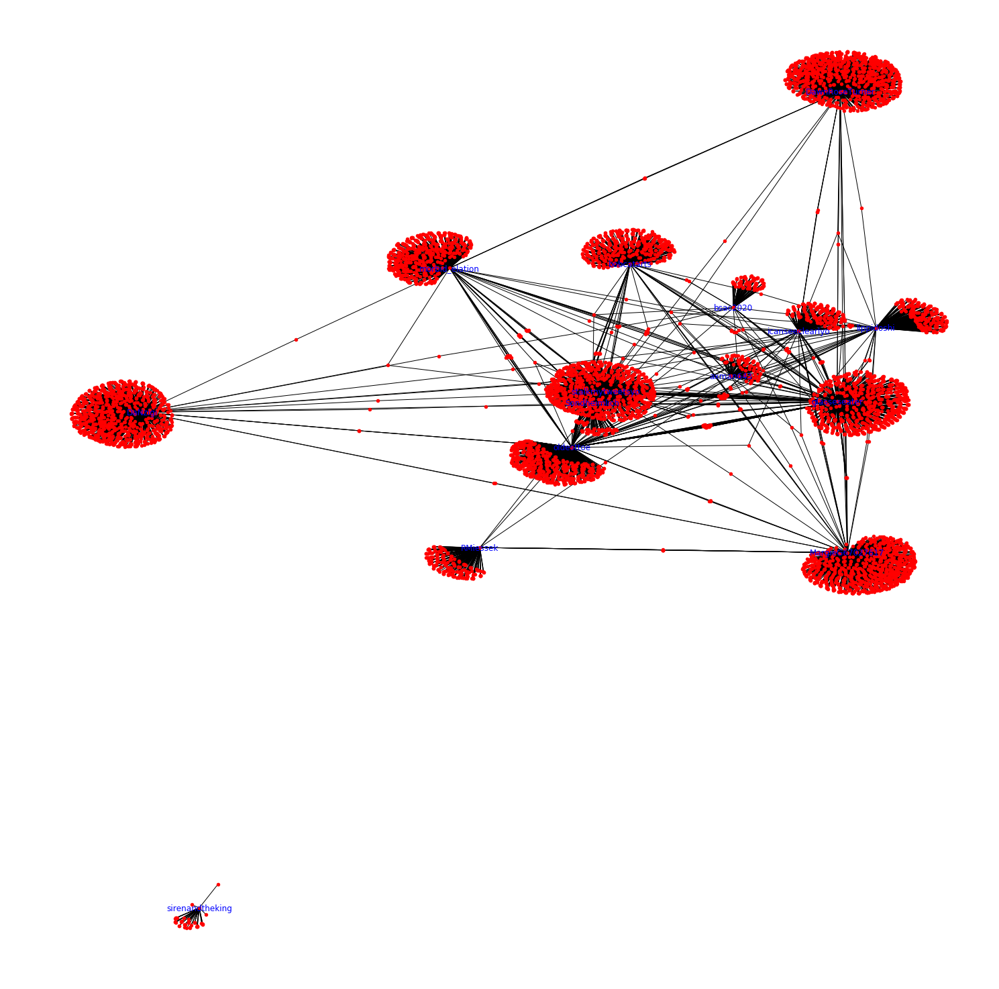

In [ ]:

plt.figure(1, figsize=(20, 20))
nx.draw(graph, with_labels=True, node_size=20, labels=labels, font_color='b', font_size=12)
plt.show()

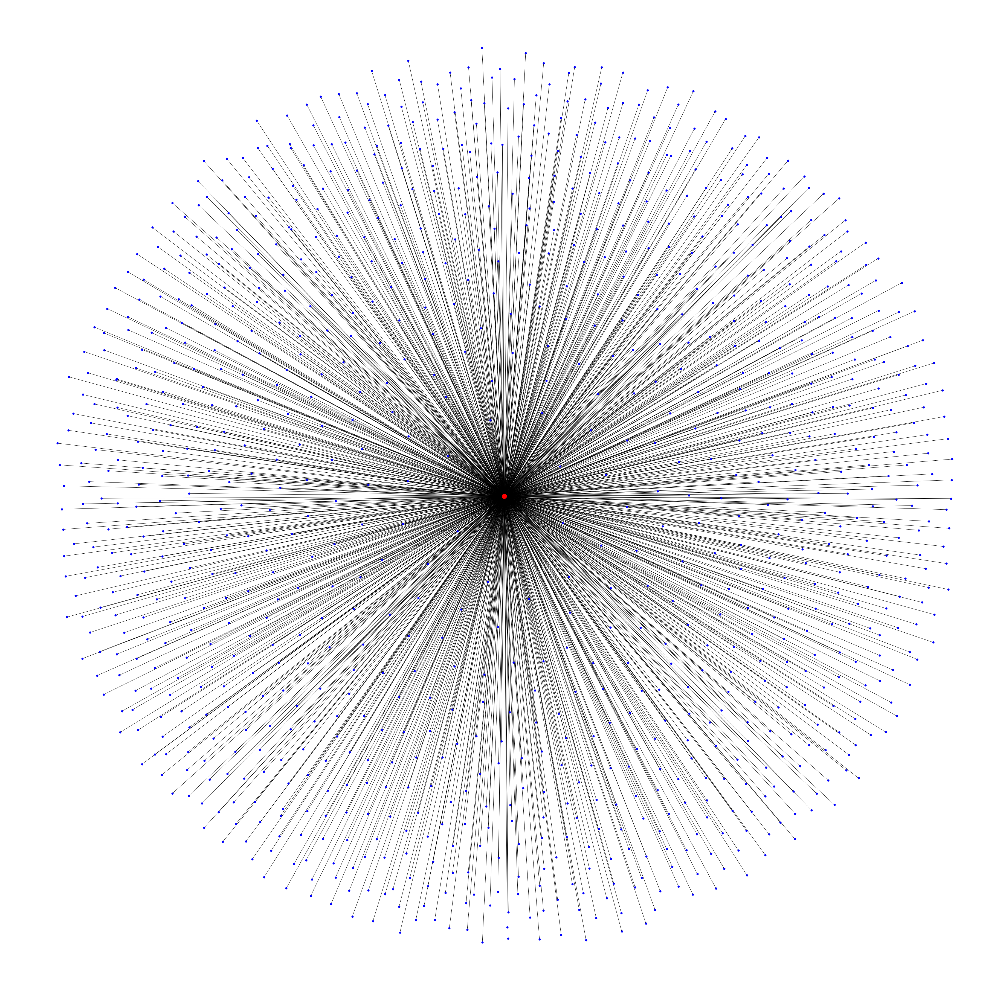

In [ ]:
node_and_degree = graph.degree()
(largest_hub, degree) = sorted(node_and_degree, key=itemgetter(1))[-1]

# Create ego graph of main hub
hub_ego = nx.ego_graph(graph, largest_hub)

# Draw graph
pos = nx.spring_layout(hub_ego)
plt.figure(1, figsize=(50, 50))
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=False)

# Draw ego as large and red
options = {"node_size": 300, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[largest_hub], **options)
# nie dorzucamy labeli, bo będzie nieczytelnie
# nx.draw_networkx_labels(hub_ego,pos=nx.spring_layout(hub_ego), font_size = 22)
plt.show()

In [ ]:
sorted_connectors  = sorted(connector_counts.items(), key=lambda item: item[1])
n_th_best =  sorted_connectors[-5:]
print(n_th_best)

[('queersocialism', 4), ('POTUS', 4), ('iww', 4), ('IlhanMN', 4), ('CoriBush', 5)]


<strong>Pobranie danych dla 50 użytkowników po 50 osób obserwowanych</strong> - folder <strong><i>dane_50_userow_50_following</i></strong>


In [ ]:
import pandas as pd 
import numpy as np
all_files = []

for i in range(1,10):
  all_files.append('./following_pairs_{}.csv'.format(i))

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=None)
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True).to_numpy()
print(np.shape(frame))

(2230, 2)


In [ ]:
import networkx as nx
from matplotlib import pyplot as plt

MIN_EDGES_FOR_LABEL = 10
CONNECTOR_LABELS = 2

graph = nx.Graph()

for i in frame:
  graph.add_edge(*i)


labels = {}
connector_labels = {}
connector_counts = {}
for node in graph.nodes():
  labels[node] = ""
  connector_labels[node] = ""
  connector_counts[node] = None
  graph_edgex_len = len(graph.edges(node))
  if graph_edgex_len > MIN_EDGES_FOR_LABEL:
    labels[node] = node
  if graph_edgex_len >= CONNECTOR_LABELS and graph_edgex_len <= 20:
    connector_labels[node] = node
    connector_counts[node] = graph_edgex_len


pos = nx.spring_layout(graph)


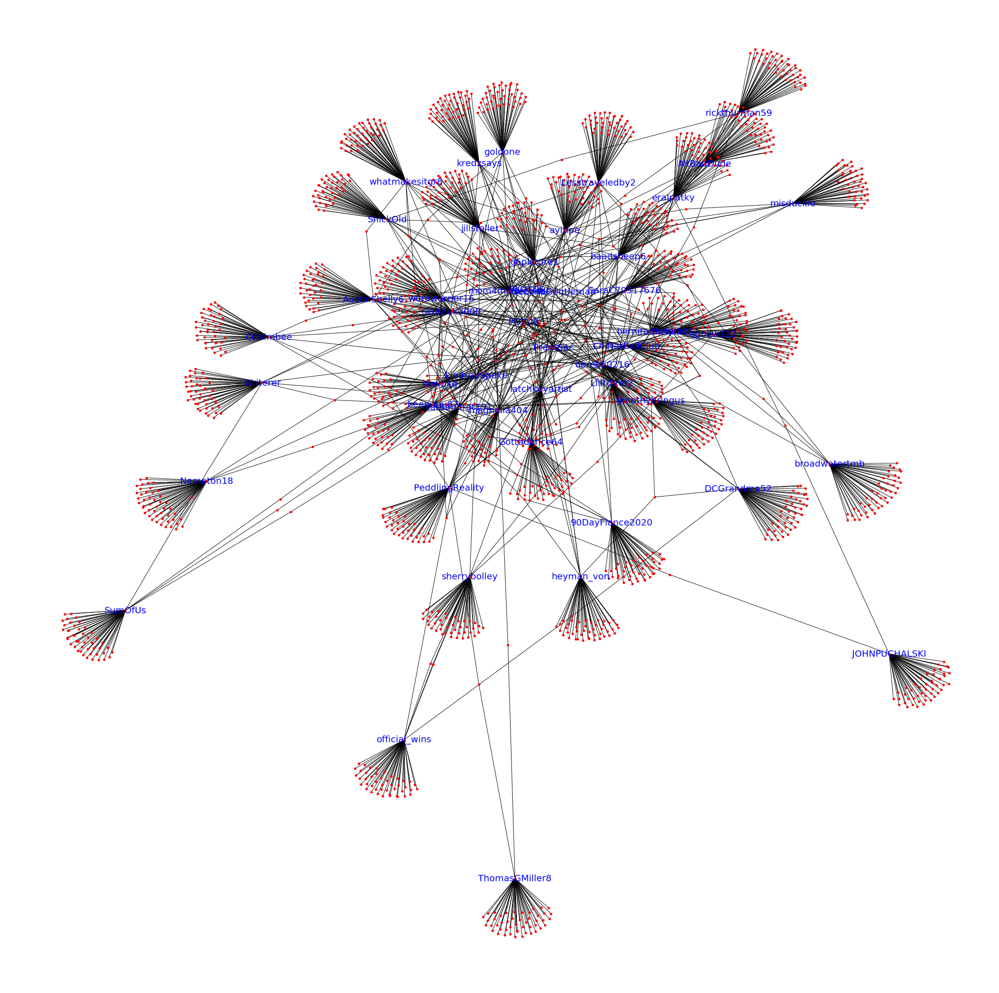

In [ ]:
plt.figure(1, figsize=(30, 30))
nx.draw(graph, with_labels=True, node_size=20, labels=labels, font_color='b', font_size=20)
plt.show()

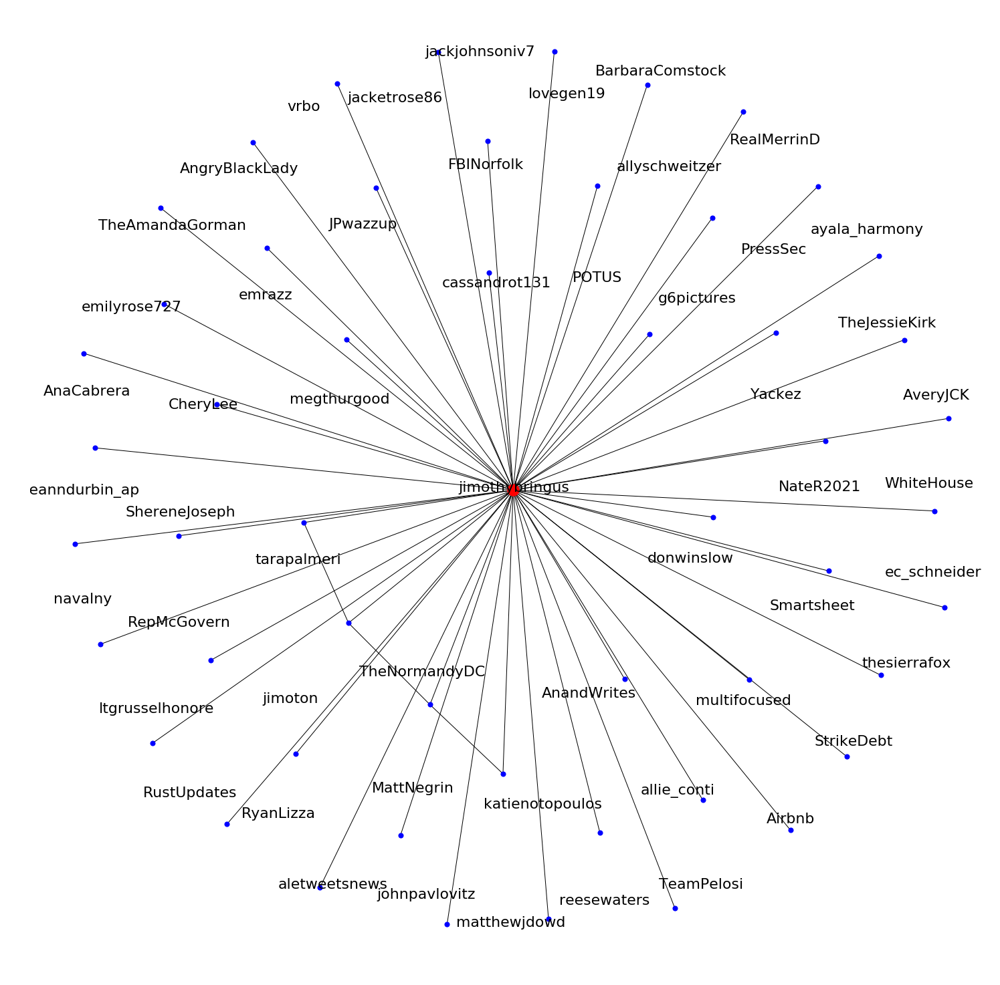

In [ ]:
node_and_degree = graph.degree()
(largest_hub, degree) = sorted(node_and_degree, key=itemgetter(1))[-1]

# Create ego graph of main hub
hub_ego = nx.ego_graph(graph, largest_hub)

# Draw graph
pos = nx.spring_layout(hub_ego)
plt.figure(1, figsize=(20, 20))
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=False)

# Draw ego as large and red
options = {"node_size": 300, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[largest_hub], **options)
nx.draw_networkx_labels(hub_ego,pos=nx.spring_layout(hub_ego), font_size = 22)
plt.show()

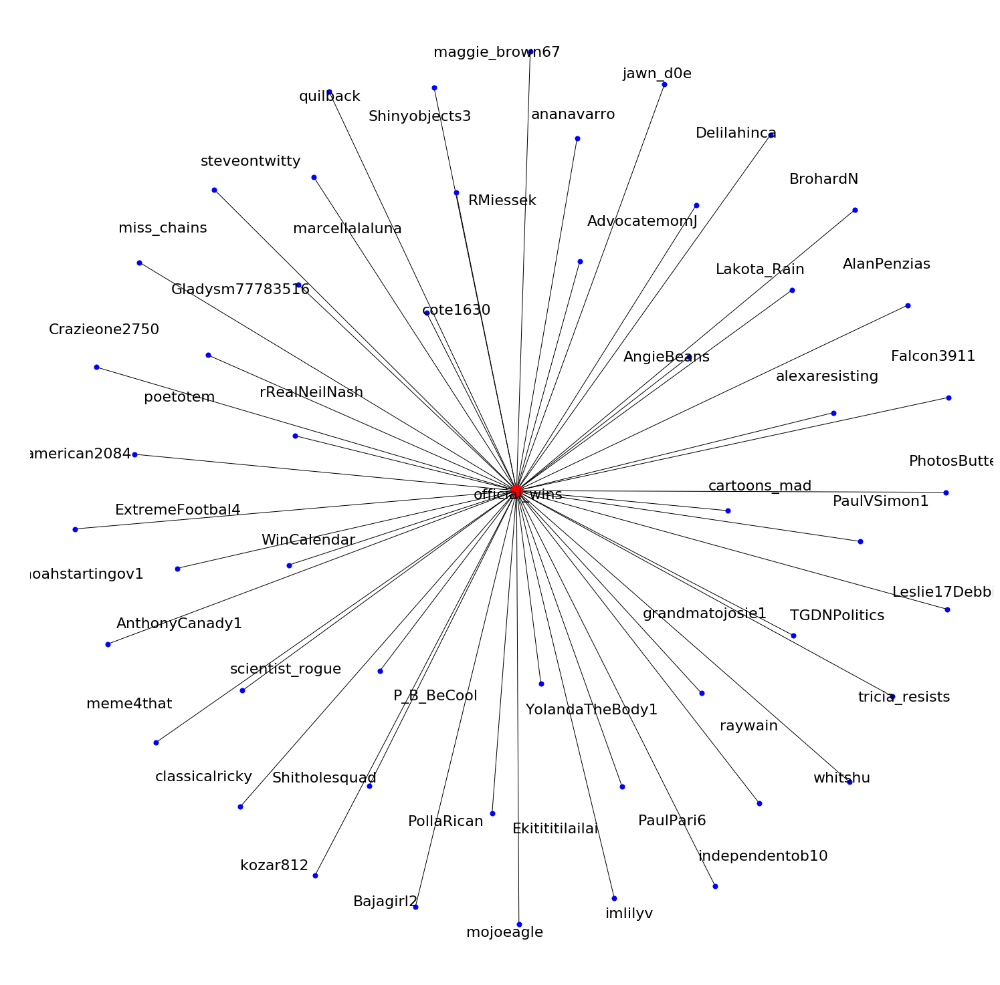

In [ ]:
node_and_degree = graph.degree()
(midlargest_hub, degree) = sorted(node_and_degree, key=itemgetter(1))[-2]

# Create ego graph of main hub
hub_ego = nx.ego_graph(graph, midlargest_hub)

# Draw graph
pos = nx.spring_layout(hub_ego)
plt.figure(1, figsize=(20, 20))
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=False)

# Draw ego as large and red
options = {"node_size": 300, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[midlargest_hub], **options)
nx.draw_networkx_labels(hub_ego,pos=nx.spring_layout(hub_ego), font_size = 22)
plt.show()

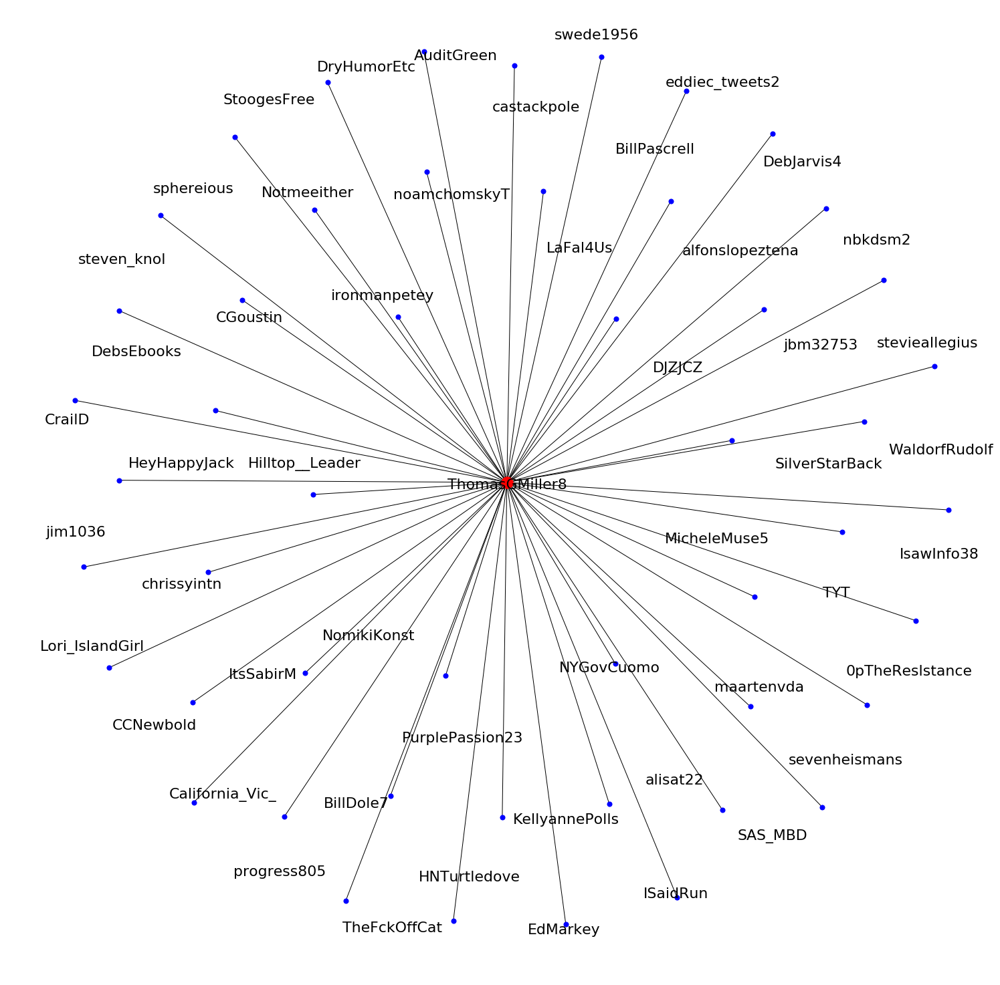

In [ ]:
node_and_degree = graph.degree()
(mlargest_hub, degree) = sorted(node_and_degree, key=itemgetter(1))[-3]

# Create ego graph of main hub
hub_ego = nx.ego_graph(graph, mlargest_hub)

# Draw graph
pos = nx.spring_layout(hub_ego)
plt.figure(1, figsize=(20, 20))
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=False)

# Draw ego as large and red
options = {"node_size": 300, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[mlargest_hub], **options)
nx.draw_networkx_labels(hub_ego,pos=nx.spring_layout(hub_ego), font_size = 22)
plt.show()

In [ ]:
sorted_connectors  = sorted(connector_counts.items(), key=lambda item: item[1])
n_th_best =  sorted_connectors[-5:]
print(n_th_best)

[('WhiteHouse', 9), ('TheAmandaGorman', 10), ('SecondGentleman', 12), ('FLOTUS', 15), ('PressSec', 17)]


<strong>Jeszcze bardziej zmniejszyłem ilość pobieranych osób obserwowanych dla profiów - tutaj już udało się pobrać wszystkie dane</strong> 

# New Section

In [ ]:
import pandas as pd 
import numpy as np
all_files = []

for i in range(1, 40):
  if i == 11:
    continue
  all_files.append('./following_pairs_{}.csv'.format(i))

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=None)
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True).to_numpy()
print(np.shape(frame))

(4473, 2)


In [ ]:
import networkx as nx
from matplotlib import pyplot as plt
# from operator import itemgetter

MIN_EDGES_FOR_LABEL = 10
CONNECTOR_LABELS = 2

graph = nx.Graph()

for i in frame:
  graph.add_edge(*i)


labels = {}
connector_labels = {}
connector_counts = {}
for node in graph.nodes():
  labels[node] = ""
  connector_labels[node] = ""
  connector_counts[node] = None
  graph_edgex_len = len(graph.edges(node))
  if graph_edgex_len > MIN_EDGES_FOR_LABEL:
    labels[node] = node
  if graph_edgex_len >= CONNECTOR_LABELS and graph_edgex_len <= 20:
    connector_labels[node] = node
    connector_counts[node] = graph_edgex_len


pos = nx.spring_layout(graph)


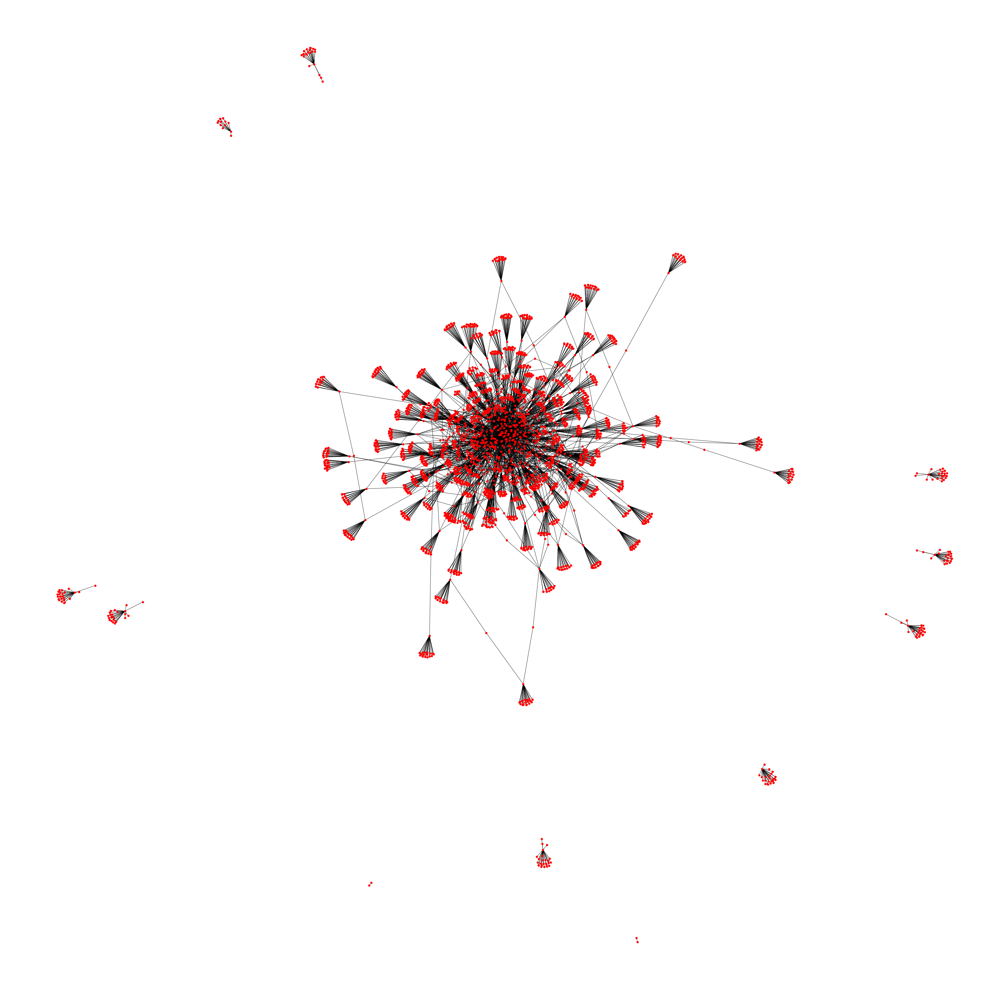

In [ ]:
plt.figure(1, figsize=(50, 50))
nx.draw(graph, with_labels=False, node_size=50)
plt.show()


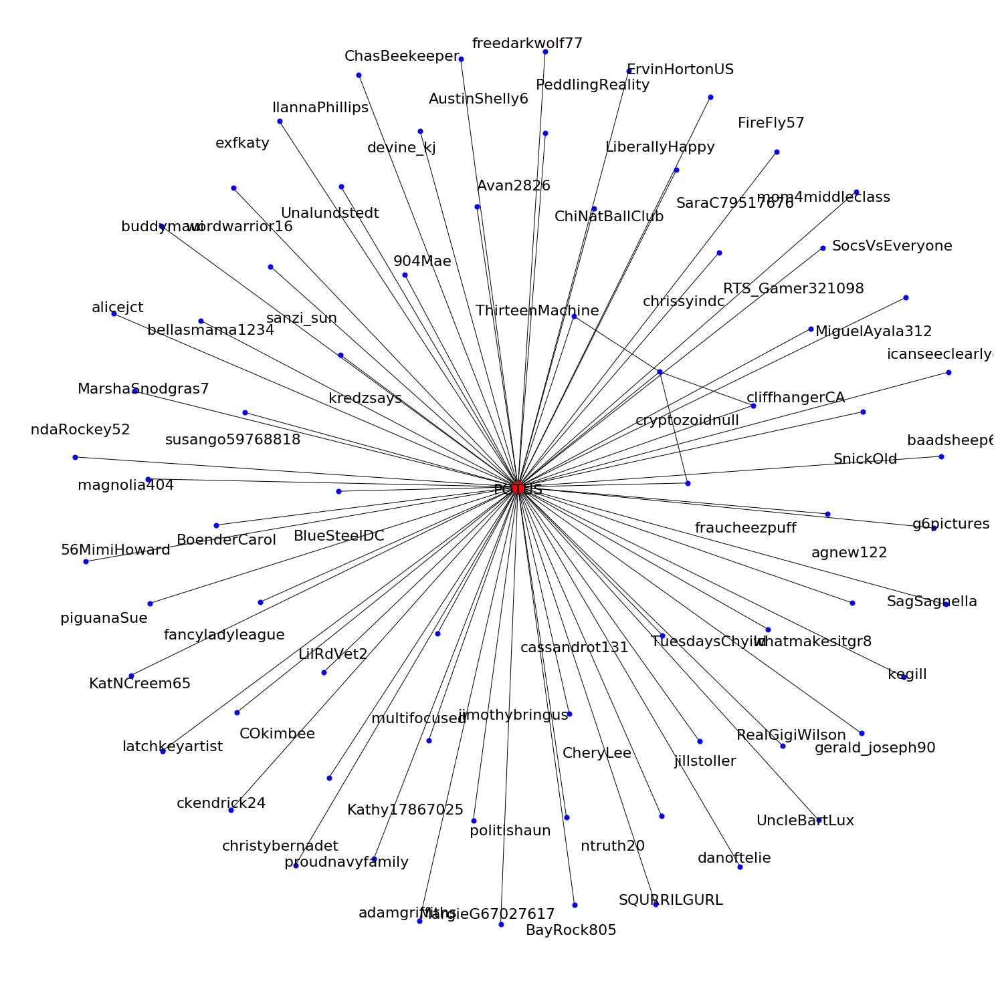

In [ ]:
############### ego
# https://networkx.org/documentation/stable/auto_examples/drawing/plot_ego_graph.html
# find node with largest degree
node_and_degree = graph.degree()
(largest_hub, degree) = sorted(node_and_degree, key=itemgetter(1))[-1]

# Create ego graph of main hub
hub_ego = nx.ego_graph(graph, largest_hub)

# Draw graph
pos = nx.spring_layout(hub_ego)
plt.figure(1, figsize=(20, 20))
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=False)

# Draw ego as large and red
options = {"node_size": 300, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[largest_hub], **options)
nx.draw_networkx_labels(hub_ego,pos=nx.spring_layout(hub_ego), font_size = 22)
plt.show()

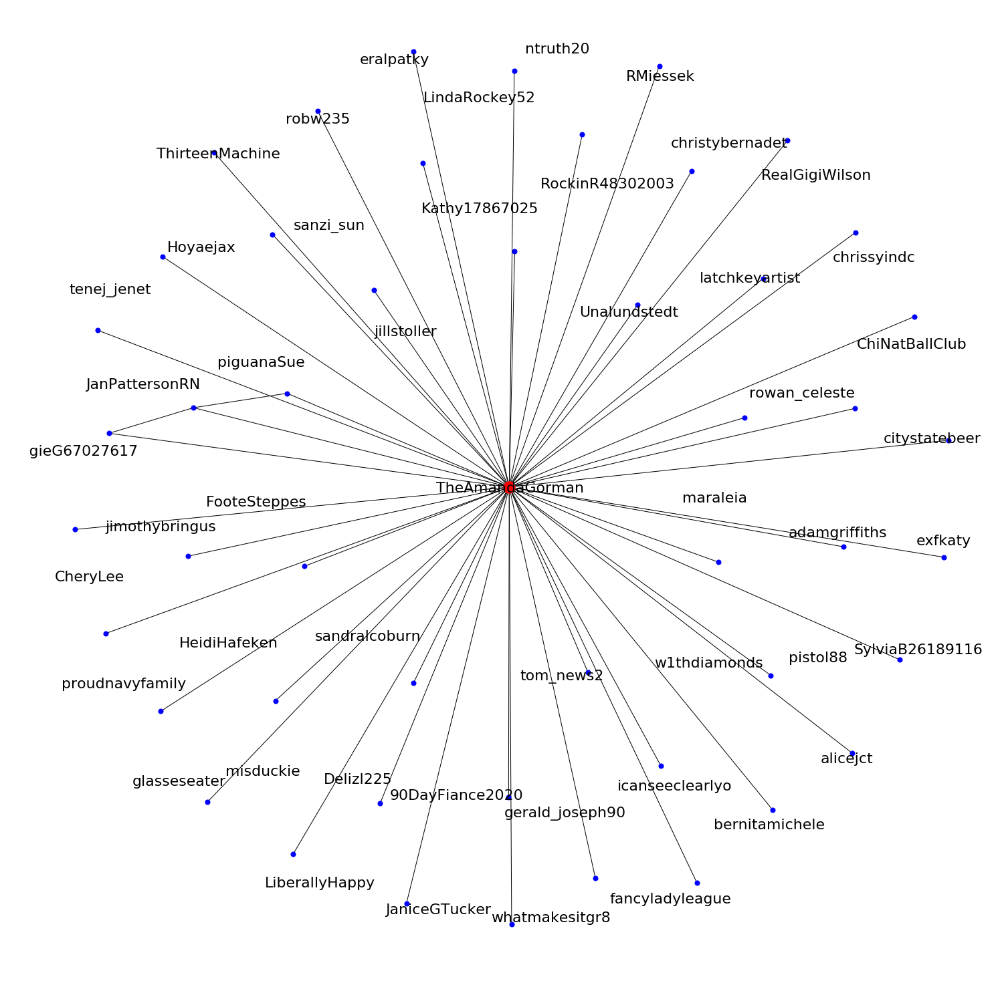

In [ ]:
(midlargest_hub, degree) = sorted(node_and_degree, key=itemgetter(1))[-2]
# Create ego graph of main hub
hub_ego = nx.ego_graph(graph, midlargest_hub)

# Draw graph
pos = nx.spring_layout(hub_ego)
plt.figure(1, figsize=(20, 20))
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=False)

# Draw ego as large and red
options = {"node_size": 300, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[midlargest_hub], **options)
nx.draw_networkx_labels(hub_ego,pos=nx.spring_layout(hub_ego), font_size = 22)
plt.show()

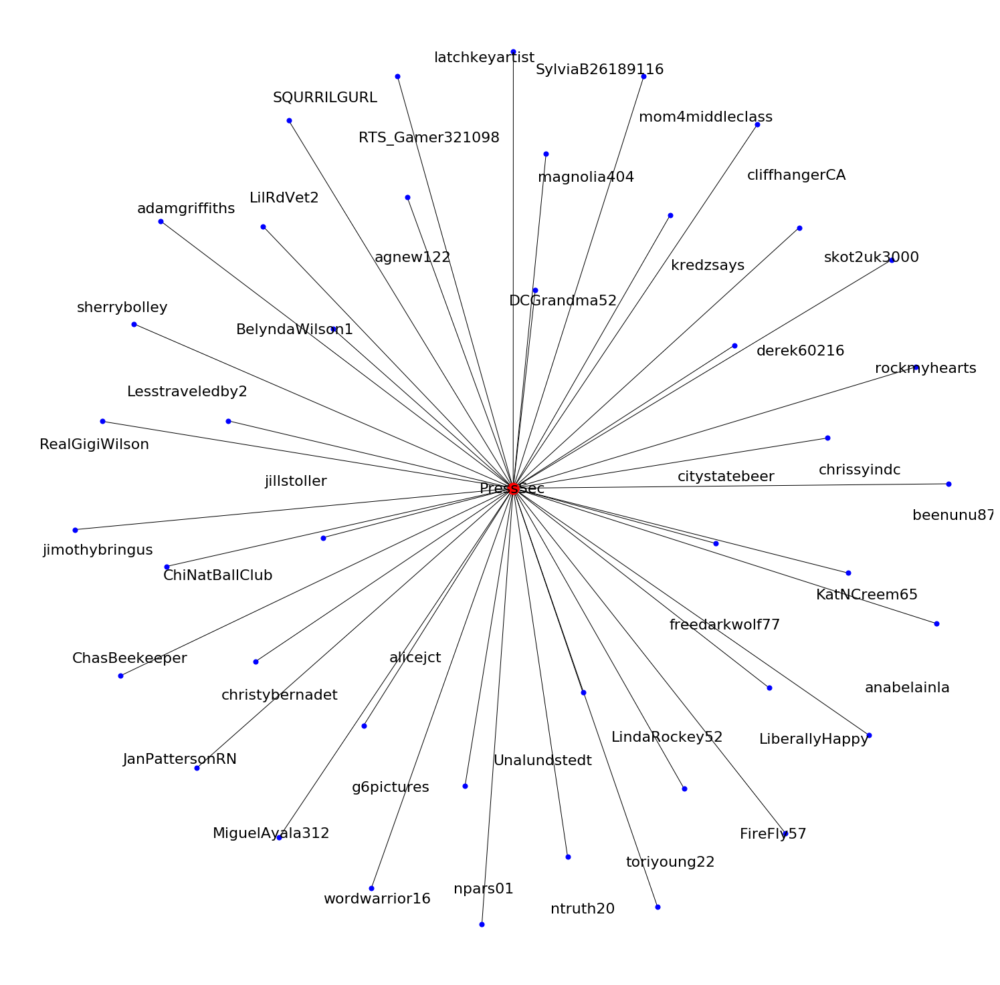

In [ ]:
(mlargest_hub, degree) = sorted(node_and_degree, key=itemgetter(1))[-3]
# Create ego graph of main hub
hub_ego = nx.ego_graph(graph, mlargest_hub)

# Draw graph
pos = nx.spring_layout(hub_ego)
plt.figure(1, figsize=(20, 20))
nx.draw(hub_ego, pos, node_color="b", node_size=50, with_labels=False)

# Draw ego as large and red
options = {"node_size": 300, "node_color": "r"}
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[mlargest_hub], **options)
nx.draw_networkx_labels(hub_ego,pos=nx.spring_layout(hub_ego), font_size = 22)
plt.show()

In [ ]:
sorted_connectors  = sorted(connector_counts.items(), key=lambda item: item[1])
n_th_best =  sorted_connectors[-5:]
print(n_th_best)

[('SamCannon45', 13), ('VP', 14), ('thematthewcooke', 16), ('jrpsaki', 17), ('CasuallyWalkin', 20)]
